In [72]:
# Import libraries

import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) # Adjusts size of the plots


# Read in data

df = pd.read_csv(r"C:\Users\mrwat\Desktop\Python Movie Correlation\movies.csv")


In [87]:
#Let's look at the data
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143,2012


In [51]:
# Check for missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [52]:
# Data types of columns

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [73]:
# change data type of columns to make more sense

df['votes'] = pd.to_numeric(df['votes'], errors='coerce').fillna(0).astype(int)
df['budget'] = pd.to_numeric(df['budget'], errors='coerce').fillna(0).astype(int)
df['gross'] = pd.to_numeric(df['gross'], errors='coerce').fillna(0).astype(int)
df['runtime'] = pd.to_numeric(df['runtime'], errors='coerce').fillna(0).astype(int)

In [88]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143,2012


In [74]:
# Create correct year column

df['yearcorrect'] = df['released'].astype(str).str.split().str[2]

In [89]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143,2012


In [75]:
df = df.sort_values(by=['gross'], inplace = False, ascending = False)

In [58]:
pd.set_option('display.max_rows', None)

In [76]:
df = df.drop(index = 3045)
df = df.drop(index = 7445)
df = df.drop(index = 5445)
df.tail()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
1183,"Silent Night, Deadly Night Part 2",R,Horror,1987,"April 10, 1987 (United States)",3.8,6400,Lee Harry,Michael Hickey,Eric Freeman,United States,100000,0,Silent Night Releasing Corporation,88,1987
1184,Creepozoids,R,Horror,1987,"October 2, 1987 (United States)",4.0,2100,David DeCoteau,Dave Eisenstark,Linnea Quigley,United States,75000,0,Titan Productions,72,1987
1192,White of the Eye,R,Horror,1987,"June 19, 1987 (United Kingdom)",6.2,2200,Donald Cammell,China Kong,David Keith,United Kingdom,0,0,Mrs. White's Productions,110,1987
5033,Loving Annabelle,Not Rated,Drama,2006,"May 24, 2007 (Germany)",6.3,12000,Katherine Brooks,Katherine Brooks,Erin Kelly,United States,1000000,0,Big Easy Pictures,77,2007
7667,Tee em el,NaN,Horror,2020,"August 19, 2020 (United States)",5.7,7,Pereko Mosia,Pereko Mosia,Siyabonga Mabaso,South Africa,0,0,PK 65 Films,102,2020


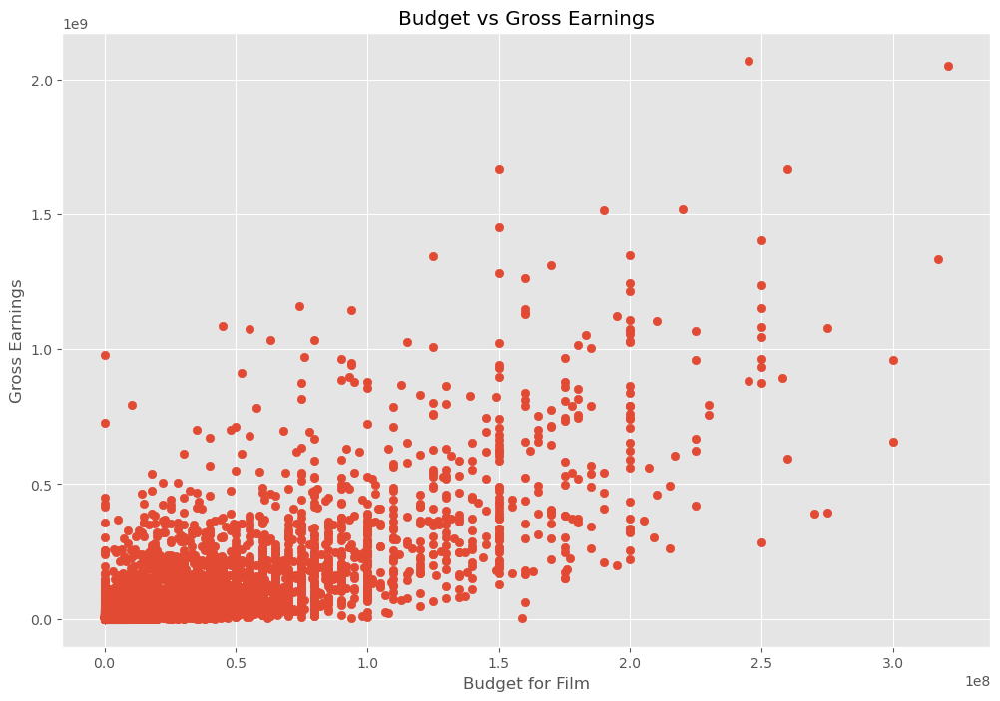

In [61]:
# Scatter plot with budget vs gross

plt.scatter(x = df['budget'], y = df['gross'])

plt.title('Budget vs Gross Earnings')
plt.ylabel('Gross Earnings')
plt.xlabel('Budget for Film')

plt.show()

In [62]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143,2012


<Axes: xlabel='budget', ylabel='gross'>

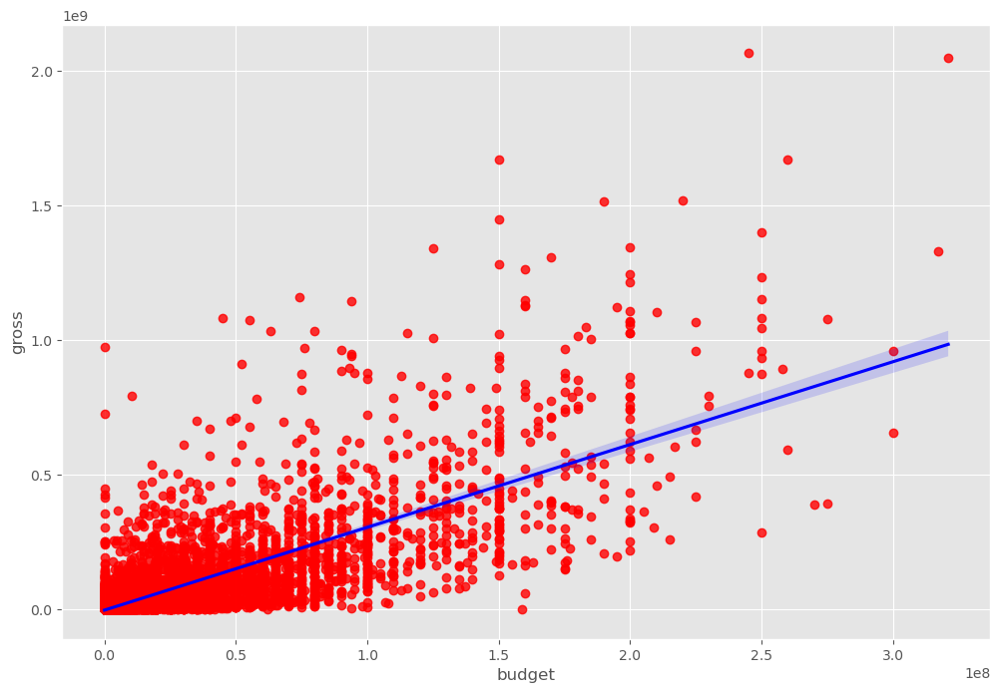

In [63]:
#Plot Budget vs Gorss using seaborn

sns.regplot(x='budget', y='gross', data = df, scatter_kws = {'color': 'red'}, line_kws = {'color':'blue'})

In [64]:
#looking at correlation

df.corr(numeric_only = True) #High correlation between budget and gross

,year,score,votes,budget,gross,runtime
year,1.000000,0.097531,0.222496,0.309558,0.270321,0.115762
score,0.097531,1.000000,0.408423,0.051897,0.185356,0.397289
votes,0.222496,0.408423,1.000000,0.480335,0.632743,0.301205
budget,0.309558,0.051897,0.480335,1.000000,0.754442,0.262045
gross,0.270321,0.185356,0.632743,0.754442,1.000000,0.233575
runtime,0.115762,0.397289,0.301205,0.262045,0.233575,1.000000


Text(0.5, 1.0, 'Correlation Matrix for Numeric Values')

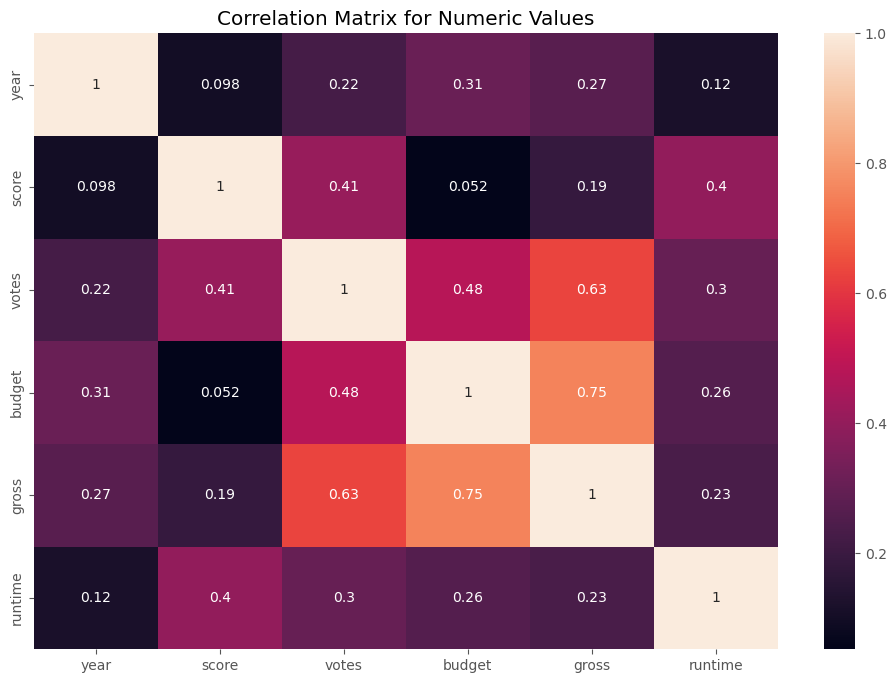

In [65]:
correlation_matrix = df.corr(numeric_only = True)

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Values')


In [66]:
# numerize non numeric fields so that we can chech their correlation as well

df_numerized = df

for col in df_numerized.columns:
    if(df_numerized[col].dtype == 'object'):
        df_numerized[col] = df_numerized[col].astype('category')
        df_numerized[col] = df_numerized[col].cat.codes

df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
6663,5142,5,0,2015,698,7.8,876000,1125,2550,524,55,245000000,2069521700,1540,138,37
7244,534,5,0,2018,192,8.4,897000,162,743,2241,55,321000000,2048359754,1606,149,40
7480,6192,4,2,2019,1488,6.9,222000,1455,1919,676,55,260000000,1670727580,2316,118,41
6653,2967,5,0,2015,1704,7.0,593000,517,3568,437,55,150000000,1670516444,2281,124,37
6043,5500,5,0,2012,2472,8.0,1300000,1517,2314,2241,55,220000000,1518815515,1606,143,34
6646,2143,5,0,2015,221,7.1,370000,1189,706,2721,55,190000000,1515341399,2281,137,37
7494,2129,4,2,2019,2676,6.8,148000,432,1950,1527,55,150000000,1450026933,2315,103,41
6644,533,5,0,2015,2235,7.3,777000,1517,2314,2241,55,250000000,1402809540,1606,141,37
7247,789,5,0,2018,959,7.3,661000,2457,3795,385,55,200000000,1347597973,1606,134,40
5845,2405,5,1,2011,1445,8.1,790000,679,4052,552,54,125000000,1342321665,2319,130,33


In [77]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103,2019
6644,Avengers: Age of Ultron,PG-13,Action,2015,"May 1, 2015 (United States)",7.3,777000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,250000000,1402809540,Marvel Studios,141,2015
7247,Black Panther,PG-13,Action,2018,"February 16, 2018 (United States)",7.3,661000,Ryan Coogler,Ryan Coogler,Chadwick Boseman,United States,200000000,1347597973,Marvel Studios,134,2018
5845,Harry Potter and the Deathly Hallows: Part 2,PG-13,Adventure,2011,"July 15, 2011 (United States)",8.1,790000,David Yates,Steve Kloves,Daniel Radcliffe,United Kingdom,125000000,1342321665,Warner Bros.,130,2011


Text(0.5, 1.0, 'Correlation Matrix for Numeric Values')

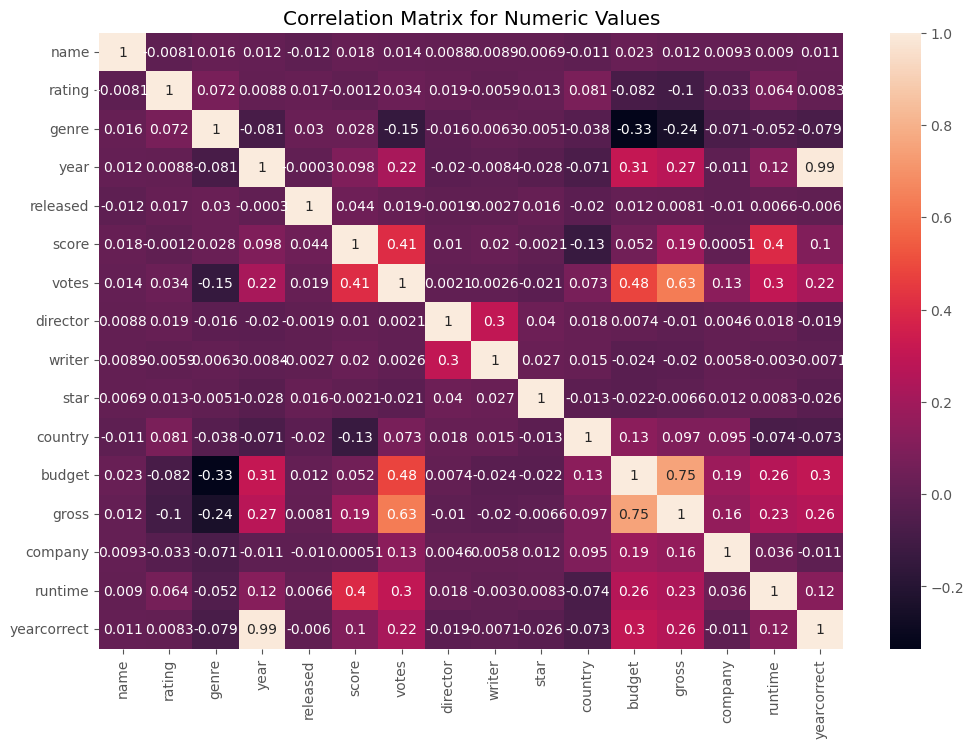

In [80]:
correlation_matrix = df_numerized.corr()

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Values')

In [84]:
corr_matrix = df_numerized.corr()

corr_pairs = corr_matrix.unstack()

corr_pairs

name         name           1.000000
             rating        -0.008097
             genre          0.015695
             year           0.011998
             released      -0.011619
             score          0.017532
             votes          0.014143
             director       0.008773
             writer         0.008856
             star           0.006855
             country       -0.010654
             budget         0.022615
             gross          0.011607
             company        0.009270
             runtime        0.008974
             yearcorrect    0.010607
rating       name          -0.008097
             rating         1.000000
             genre          0.072419
             year           0.008810
             released       0.016569
             score         -0.001245
             votes          0.034211
             director       0.019453
             writer        -0.005949
             star           0.013441
             country        0.081266
 

In [85]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre        budget        -0.334922
budget       genre         -0.334922
genre        gross         -0.241825
gross        genre         -0.241825
votes        genre         -0.145073
genre        votes         -0.145073
score        country       -0.133713
country      score         -0.133713
rating       gross         -0.099655
gross        rating        -0.099655
budget       rating        -0.082350
rating       budget        -0.082350
year         genre         -0.080848
genre        year          -0.080848
             yearcorrect   -0.078566
yearcorrect  genre         -0.078566
runtime      country       -0.074201
country      runtime       -0.074201
             yearcorrect   -0.072819
yearcorrect  country       -0.072819
country      year          -0.071078
year         country       -0.071078
company      genre         -0.070984
genre        company       -0.070984
             runtime       -0.052424
runtime      genre         -0.052424
country      genre         -0.037525
g

In [86]:
high_cor = sorted_pairs[(sorted_pairs) > 0.5]

high_cor

gross        votes          0.632743
votes        gross          0.632743
budget       gross          0.754442
gross        budget         0.754442
yearcorrect  year           0.990059
year         yearcorrect    0.990059
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64

In [ ]:
# Votes and budget have the highest correlation to gross earnings